In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
from torchvision import models, transforms
from torch.utils.data import DataLoader,Dataset
from torchvision.datasets import ImageFolder
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score, recall_score, f1_score
import torch
import torch.nn as nn

TRAIN_DIR = "/content/drive/MyDrive/ColabNotebooks/PlantsDataset/Train_Set_Folder"
TEST_DIR = "/content/drive/MyDrive/ColabNotebooks/PlantsDataset/Test_Set_Folder"
VALIDATION_DIR = "/content/drive/MyDrive/ColabNotebooks/PlantsDataset/Validation_Set_Folder"


class AugmentedImageFolder(Dataset):
    def __init__(self, root, transform=None, max_images_per_class=799, base_images_per_class=500):
        self.samples = []
        self.transform = transform
        class_counts = {}

        for class_name in sorted(os.listdir(root)):
            class_dir = os.path.join(root, class_name)
            if not os.path.isdir(class_dir):
                continue
            images = [os.path.join(class_dir, image_name) for image_name in os.listdir(class_dir)
                      if os.path.isfile(os.path.join(class_dir, image_name)) and image_name.lower().endswith(('.png', '.jpg', '.jpeg'))]
            images = images[:base_images_per_class]
            augment_count = max_images_per_class - base_images_per_class
            augmented_images = images * (augment_count // base_images_per_class) + images[:augment_count % base_images_per_class]
            for image_path in images + augmented_images:
                self.samples.append((image_path, class_name))

        self.class_names = sorted(set(class_name for _, class_name in self.samples))
        self.class_to_idx = {cls_name: idx for idx, cls_name in enumerate(self.class_names)}

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        path, class_name = self.samples[idx]
        image = Image.open(path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image, self.class_to_idx[class_name]

def get_dataloader(data_dir: str, input_size: tuple=(224, 224), augment: bool=False, shuffle: bool=False, batch_size: int=64):
    transform_list = [transforms.Resize(input_size)]
    if augment:
        transform_list.extend([
            transforms.RandomRotation(15),
            transforms.RandomHorizontalFlip(),
            transforms.RandomResizedCrop(input_size, scale=(0.8, 1.0))
        ])
    transform_list.append(transforms.ToTensor())
    dataset = AugmentedImageFolder(data_dir, transform=transforms.Compose(transform_list))
    dataloader = DataLoader(dataset, shuffle=shuffle, batch_size=batch_size, num_workers=2, pin_memory=True)
    return dataloader

train_dl = get_dataloader(data_dir=TRAIN_DIR, augment=True, shuffle=True, batch_size=64)
validation_dl = get_dataloader(data_dir=VALIDATION_DIR)
test_dl = get_dataloader(data_dir=TEST_DIR)

In [3]:
import torch
import torch.nn as nn

# Инициализация модели
vgg16 = models.vgg16(pretrained=True)

# Замораживание всех слоев кроме последних
for param in vgg16.features.parameters():
    param.requires_grad = False

# Замена классификатора для вашего числа классов
vgg16.classifier[6] = nn.Linear(4096, 10)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:05<00:00, 99.9MB/s]


In [4]:
# Архитектура модели ResNet50
class Bottleneck(nn.Module):
    expansion = 4

    def __init__(self, in_channels, out_channels, stride=1):
        super(Bottleneck, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False)
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(out_channels)
        self.conv3 = nn.Conv2d(out_channels, out_channels * self.expansion, kernel_size=1, bias=False)
        self.bn3 = nn.BatchNorm2d(out_channels * self.expansion)
        self.relu = nn.ReLU(inplace=True)

        self.downsample = None
        if stride != 1 or in_channels != out_channels * self.expansion:
            self.downsample = nn.Sequential(
                nn.Conv2d(in_channels, out_channels * self.expansion, kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(out_channels * self.expansion)
            )

    def forward(self, x):
        identity = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)

        out = self.conv3(out)
        out = self.bn3(out)

        if self.downsample is not None:
            identity = self.downsample(x)

        out += identity
        out = self.relu(out)

        return out

class ResNet_50(nn.Module):
    def __init__(self, num_classes=10):
        super(ResNet_50, self).__init__()
        self.in_channels = 64
        self.conv1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.layer1 = self._make_layer(Bottleneck, 64, 3, stride=1)
        self.layer2 = self._make_layer(Bottleneck, 128, 4, stride=2)
        self.layer3 = self._make_layer(Bottleneck, 256, 6, stride=2)
        self.layer4 = self._make_layer(Bottleneck, 512, 3, stride=2)
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(512 * Bottleneck.expansion, num_classes)

    def _make_layer(self, block, out_channels, blocks, stride=1):
        layers = [block(self.in_channels, out_channels, stride)]
        self.in_channels = out_channels * block.expansion
        for _ in range(1, blocks):
            layers.append(block(self.in_channels, out_channels))
        return nn.Sequential(*layers)

    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.fc(x)
        return x

resnet50 = ResNet_50()
resnet50 = nn.DataParallel(resnet50)

In [5]:
def imshow(inp, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    plt.imshow(inp)
    if title:
        plt.title(title, fontsize=14)
    plt.axis('off')

def visualize_model(model, class_names, num_images_per_class=5):
    model.eval()
    class_count = {name: 0 for name in class_names}  # Словарь для отслеживания количества изображений каждого класса
    fig = plt.figure(figsize=(15, 3 * len(class_names)))  # Увеличенная высота для удобства отображения

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(test_dl):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                label_idx = labels[j].item()  # Получение целочисленного значения индекса метки
                label = class_names[label_idx]
                if class_count[label] < num_images_per_class:
                    class_count[label] += 1
                    ax = plt.subplot(len(class_names), num_images_per_class, class_count[label] + num_images_per_class * label_idx)
                    title = f'Prediction: {class_names[preds[j].item()]}\nTrue: {label}'
                    imshow(inputs.cpu().data[j], title=title)

                if all(count == num_images_per_class for count in class_count.values()):
                    plt.tight_layout()
                    plt.show()
                    return

In [10]:
import torch
from torch import nn, optim

import csv


def get_device():
    if torch.cuda.is_available():
        return torch.device("cuda")
    return torch.device("cpu")

def train_one_epoch(model, trainloader, device, optimizer, criterion):
    model.train()
    running_loss = 0.0
    total = 0
    correct = 0

    for data in trainloader:
        inputs, labels = data[0].to(device), data[1].to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        total += len(labels)
        correct += (predicted == labels).sum().item()

    epoch_loss = running_loss / len(trainloader)
    accuracy = 100 * correct / total
    return epoch_loss, accuracy

def evaluate_on_validation_set(model, validationloader, device, criterion):
    model.eval()
    validation_loss = 0.0
    validation_total = 0
    validation_correct = 0

    with torch.no_grad():
        for data in validationloader:
            inputs, labels = data[0].to(device), data[1].to(device)
            outputs = model(inputs)
            validation_loss += criterion(outputs, labels).item()
            _, predicted = torch.max(outputs.data, 1)
            validation_total += len(labels)
            validation_correct += (predicted == labels).sum().item()

    validation_epoch_loss = validation_loss / len(validationloader)
    validation_accuracy = 100 * validation_correct / validation_total
    return validation_epoch_loss, validation_accuracy

def evaluate_on_test_set(model, test_loader, device):
    model.eval()
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.view(-1).cpu().numpy())
            all_labels.extend(labels.view(-1).cpu().numpy())

    test_accuracy = 100 * (sum([pred == label for pred, label in zip(all_preds, all_labels)]) / len(all_labels))
    test_precision_macro = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    test_recall_macro = recall_score(all_labels, all_preds, average='macro', zero_division=0)
    test_f1_macro = f1_score(all_labels, all_preds, average='macro', zero_division=0)
    test_precision_weighted = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    test_recall_weighted = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    test_f1_weighted = f1_score(all_labels, all_preds, average='weighted', zero_division=0)

    return (test_accuracy, test_precision_macro, test_recall_macro, test_f1_macro,
            test_precision_weighted, test_recall_weighted, test_f1_weighted)

def plot_metrics(num_epochs, train_accuracies, validation_accuracies, train_losses, validation_losses,
                 test_accuracies, test_precisions_macro, test_recalls_macro, test_f1_scores_macro,
                 test_precisions_weighted, test_recalls_weighted, test_f1_scores_weighted,isVGG16):
    plt.figure(figsize=(12, 8))
    plt.plot(range(1, num_epochs + 1), train_accuracies, label='Train Accuracy')
    plt.plot(range(1, num_epochs + 1), validation_accuracies, label='Validation Accuracy')
    plt.plot(range(1, num_epochs + 1), test_accuracies, label='Test Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Accuracy over Epochs')
    plt.legend()
    plt.show()

    plt.figure(figsize=(12, 8))
    plt.plot(range(1, num_epochs + 1), train_losses, label='Train Loss')
    plt.plot(range(1, num_epochs + 1), validation_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Loss over Epochs')
    plt.legend()
    plt.show()

    # Построение графика метрик для теста (macro)
    metrics = ['precision', 'recall', 'f1_score']
    macro_scores = [test_precisions_macro[-1], test_recalls_macro[-1], test_f1_scores_macro[-1]]
    weighted_scores = [test_precisions_weighted[-1], test_recalls_weighted[-1], test_f1_scores_weighted[-1]]

    x = np.arange(len(metrics))  # метки для групп
    width = 0.2  # ширина столбцов

    fig, ax = plt.subplots(figsize=(10, 8))
    rects1 = ax.bar(x - width/2, macro_scores, width, label='macro')
    rects2 = ax.bar(x + width/2, weighted_scores, width, label='weighted')

    # Добавление подписей
    ax.set_ylabel('Score')
    if not isVGG16:
      ax.set_title('ResNet50 metrics')
    else:
      ax.set_title('VGG16 metrics')
    ax.set_xticks(x)
    ax.set_xticklabels(metrics)
    ax.legend()

    def autolabel(rects):
        for rect in rects:
            height = rect.get_height()
            ax.annotate('{}'.format(round(height, 2)),
                        xy=(rect.get_x() + rect.get_width() / 2, height),
                        xytext=(0, 3),  # 3 points vertical offset
                        textcoords="offset points",
                        ha='center', va='bottom')

    autolabel(rects1)
    autolabel(rects2)

    fig.tight_layout()
    plt.show()

def train_and_evaluate(model, trainloader, validationloader, test_loader, isVGG16):
    device = get_device()
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    num_epochs = 15
    train_losses = []
    train_accuracies = []
    validation_losses = []
    validation_accuracies = []
    test_accuracies = []
    test_precisions_macro = []
    test_recalls_macro = []
    test_f1_scores_macro = []
    test_precisions_weighted = []
    test_recalls_weighted = []
    test_f1_scores_weighted = []

    for epoch in range(num_epochs):
        # Training phase
        train_loss, train_accuracy = train_one_epoch(model, trainloader, device, optimizer, criterion)
        train_losses.append(train_loss)
        train_accuracies.append(train_accuracy)
        print(f'Epoch [{epoch + 1}/{num_epochs}], Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%')

        # Validation phase
        validation_loss, validation_accuracy = evaluate_on_validation_set(model, validationloader, device, criterion)
        validation_losses.append(validation_loss)
        validation_accuracies.append(validation_accuracy)
        print(f'Epoch [{epoch + 1}/{num_epochs}], Validate Loss: {validation_loss:.4f}, Validate Accuracy: {validation_accuracy:.2f}%')

        # Testing phase
        (test_accuracy, test_precision_macro, test_recall_macro, test_f1_macro,
         test_precision_weighted, test_recall_weighted, test_f1_weighted) = evaluate_on_test_set(model, test_loader, device)

        test_accuracies.append(test_accuracy)
        test_precisions_macro.append(test_precision_macro)
        test_recalls_macro.append(test_recall_macro)
        test_f1_scores_macro.append(test_f1_macro)
        test_precisions_weighted.append(test_precision_weighted)
        test_recalls_weighted.append(test_recall_weighted)
        test_f1_scores_weighted.append(test_f1_weighted)

        print(f'Epoch [{epoch + 1}/{num_epochs}], Test Accuracy: {test_accuracy:.2f}%, '
              f'Test Precision (macro): {test_precision_macro:.2f}, Test Recall (macro): {test_recall_macro:.2f}, Test F1 Score (macro): {test_f1_macro:.2f}, '
              f'Test Precision (weighted): {test_precision_weighted:.2f}, Test Recall (weighted): {test_recall_weighted:.2f}, Test F1 Score (weighted): {test_f1_weighted:.2f}')

    # Plot metrics
    plot_metrics(num_epochs, train_accuracies, validation_accuracies, train_losses, validation_losses,
                 test_accuracies, test_precisions_macro, test_recalls_macro, test_f1_scores_macro,
                 test_precisions_weighted, test_recalls_weighted, test_f1_scores_weighted)

    # Save the entire model
    if isVGG16:
        path_to_save_full = '/content/drive/My Drive/ColabNotebooks/vgg16Model.pth'
    else:
        path_to_save_full = '/content/drive/My Drive/ColabNotebooks/resnet50Model.pth'

    torch.save(model, path_to_save_full)

    return train_losses, train_accuracies, validation_losses, validation_accuracies, test_accuracies, test_precisions_macro, test_recalls_macro, test_f1_scores_macro, test_precisions_weighted, test_recalls_weighted, test_f1_scores_weighted

Epoch [1/15], Train Loss: 0.2780, Train Accuracy: 95.73%
Epoch [1/15], Validate Loss: 0.6255, Validate Accuracy: 93.86%
Epoch [1/15], Test Accuracy: 93.49%, Test Precision (macro): 0.93, Test Recall (macro): 0.93, Test F1 Score (macro): 0.93, Test Precision (weighted): 0.93, Test Recall (weighted): 0.93, Test F1 Score (weighted): 0.93
Epoch [2/15], Train Loss: 0.4277, Train Accuracy: 94.52%
Epoch [2/15], Validate Loss: 0.7726, Validate Accuracy: 92.67%
Epoch [2/15], Test Accuracy: 92.89%, Test Precision (macro): 0.93, Test Recall (macro): 0.93, Test F1 Score (macro): 0.93, Test Precision (weighted): 0.93, Test Recall (weighted): 0.93, Test F1 Score (weighted): 0.93
Epoch [3/15], Train Loss: 0.4868, Train Accuracy: 94.66%
Epoch [3/15], Validate Loss: 0.6998, Validate Accuracy: 91.98%
Epoch [3/15], Test Accuracy: 92.69%, Test Precision (macro): 0.93, Test Recall (macro): 0.93, Test F1 Score (macro): 0.93, Test Precision (weighted): 0.93, Test Recall (weighted): 0.93, Test F1 Score (weigh

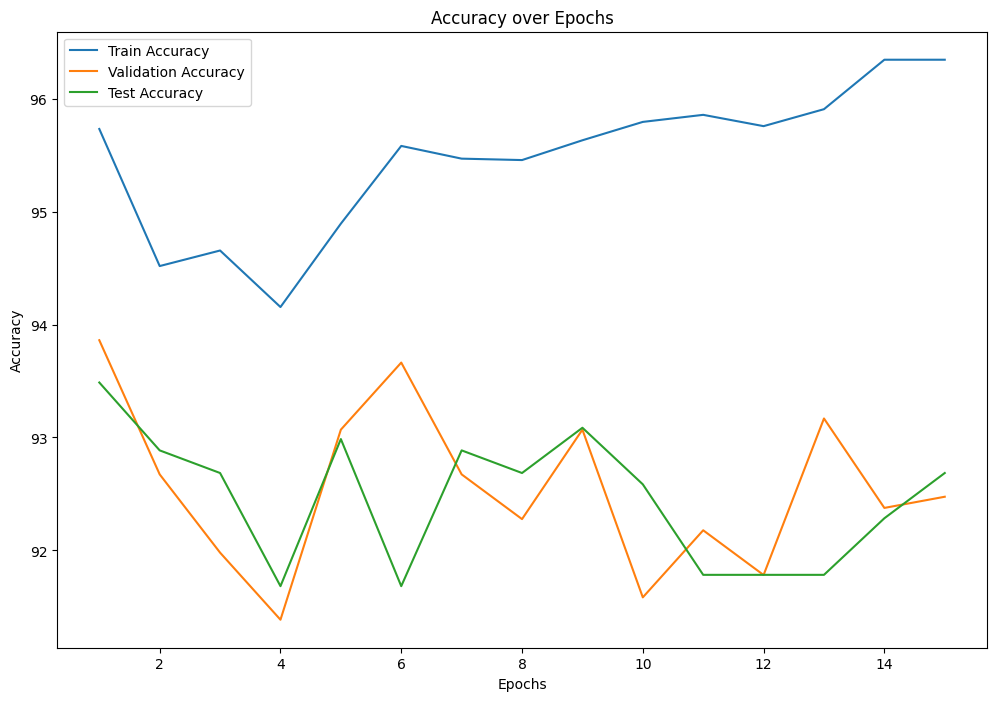

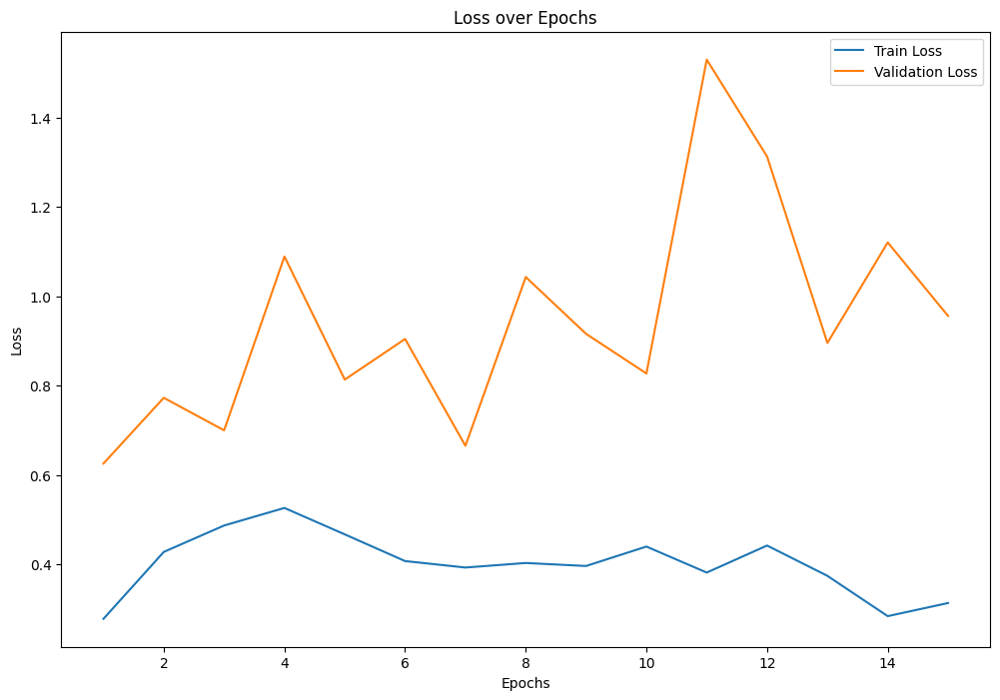

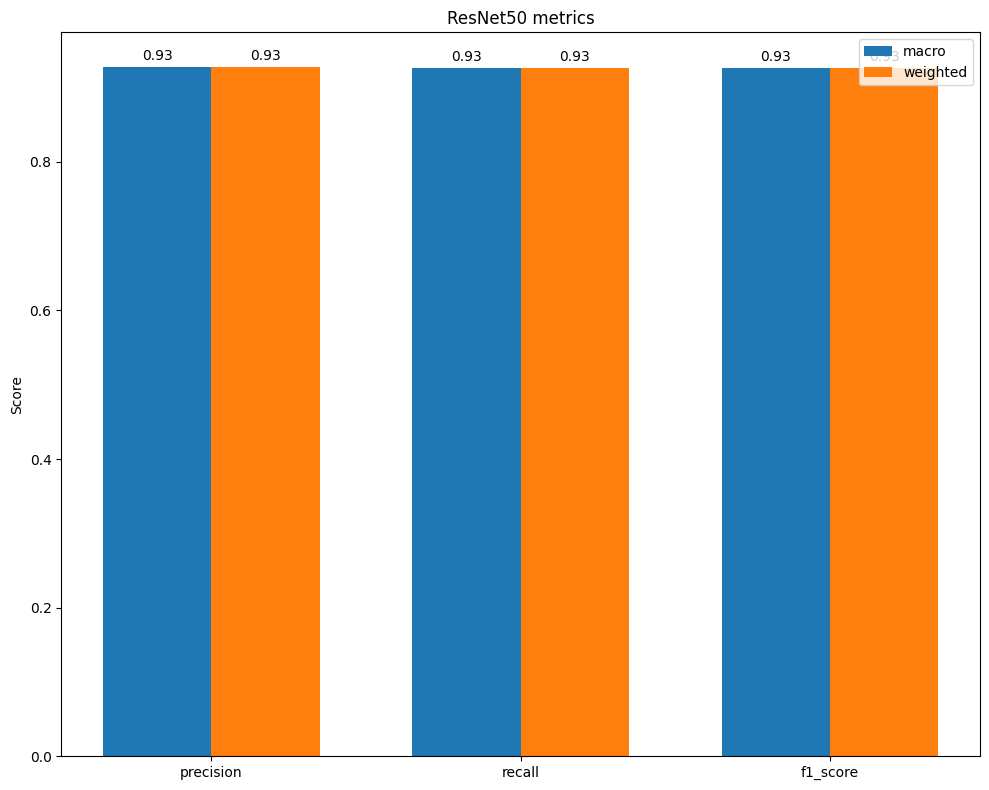

ValueError: too many values to unpack (expected 8)

In [11]:
train_losses, train_accuracies, validation_losses, validation_accuracies, test_accuracies, test_precisions_macro, test_recalls_macro, test_f1_scores_macro, test_precisions_weighted, test_recalls_weighted, test_f1_scores_weighted = train_and_evaluate(model=vgg16, trainloader=train_dl, validationloader=validation_dl, test_loader=test_dl, isVGG16=True)

In [14]:
# Загрузка всей модели
path_to_load_full = '/content/drive/My Drive/ColabNotebooks/vgg16Model.pth'

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
m = models.vgg16(pretrained=True)
for param in m.features.parameters():
    param.requires_grad = False
m.classifier[6] = nn.Linear(4096, 30)
m = torch.load(path_to_load_full)
m.to(device)
m.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

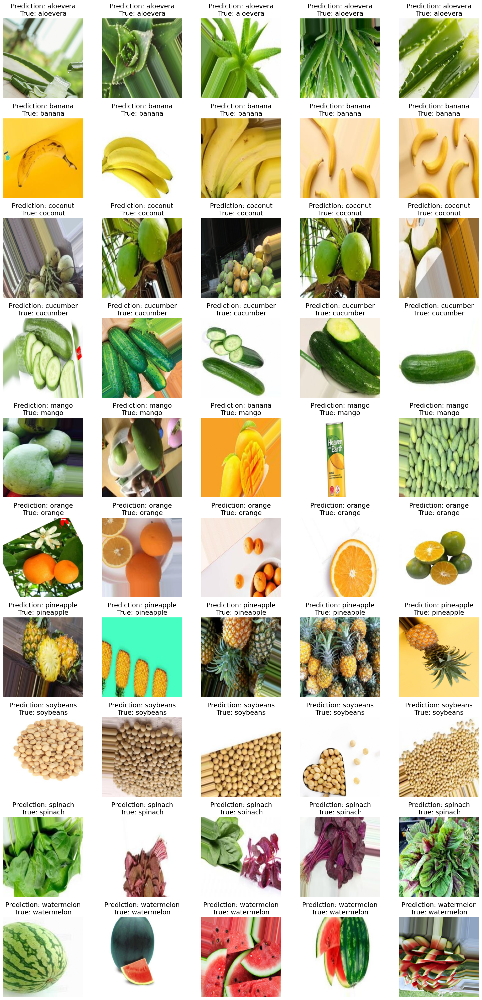

In [16]:
visualize_model(m, test_dl.dataset.class_names)

Epoch [1/15], Train Loss: 1.6392, Train Accuracy: 47.18%
Epoch [1/15], Validate Loss: 2.5903, Validate Accuracy: 43.07%
Epoch [1/15], Test Accuracy: 40.68%, Test Precision (macro): 0.45, Test Recall (macro): 0.41, Test F1 Score (macro): 0.36, Test Precision (weighted): 0.45, Test Recall (weighted): 0.41, Test F1 Score (weighted): 0.36
Epoch [2/15], Train Loss: 1.2923, Train Accuracy: 58.14%
Epoch [2/15], Validate Loss: 1.6081, Validate Accuracy: 48.02%
Epoch [2/15], Test Accuracy: 46.79%, Test Precision (macro): 0.53, Test Recall (macro): 0.47, Test F1 Score (macro): 0.45, Test Precision (weighted): 0.53, Test Recall (weighted): 0.47, Test F1 Score (weighted): 0.45
Epoch [3/15], Train Loss: 1.1484, Train Accuracy: 62.03%
Epoch [3/15], Validate Loss: 1.1346, Validate Accuracy: 63.76%
Epoch [3/15], Test Accuracy: 60.42%, Test Precision (macro): 0.65, Test Recall (macro): 0.60, Test F1 Score (macro): 0.60, Test Precision (weighted): 0.65, Test Recall (weighted): 0.60, Test F1 Score (weigh

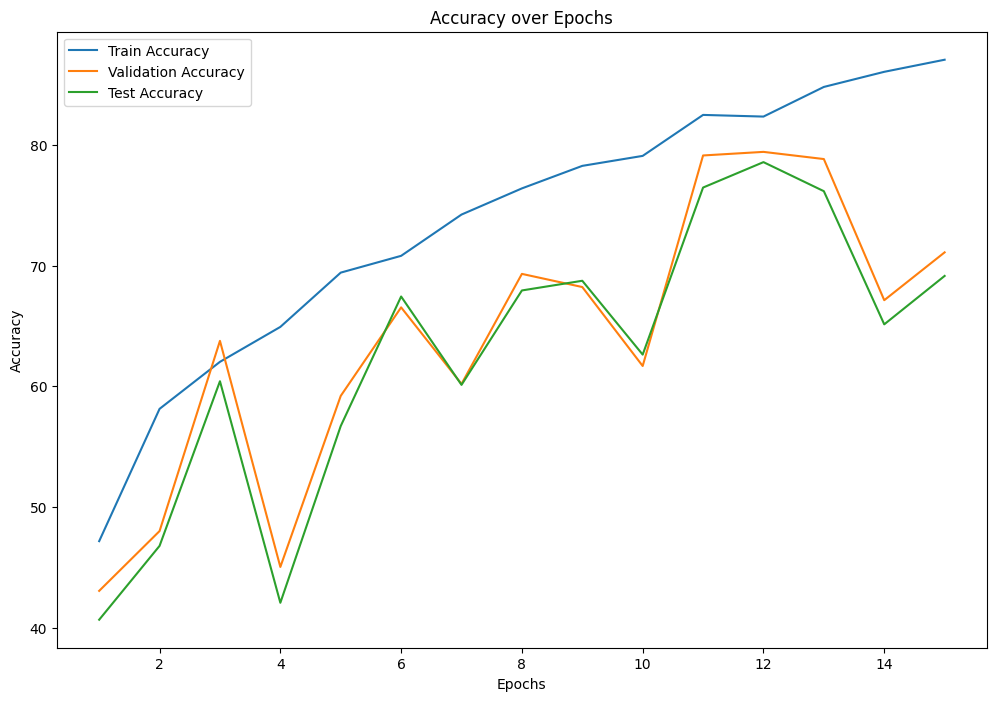

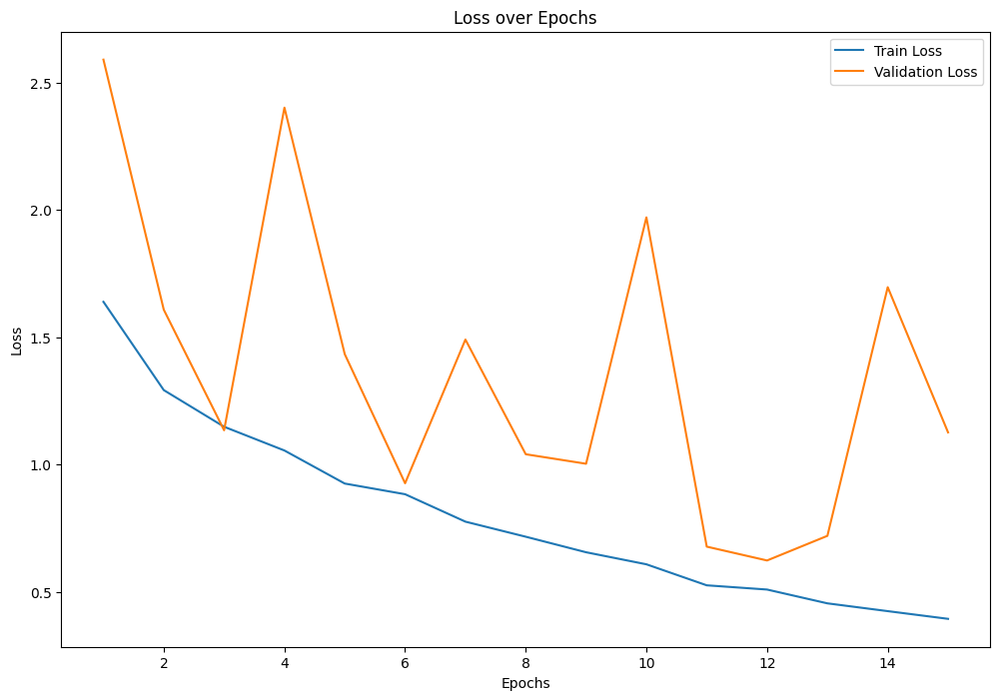

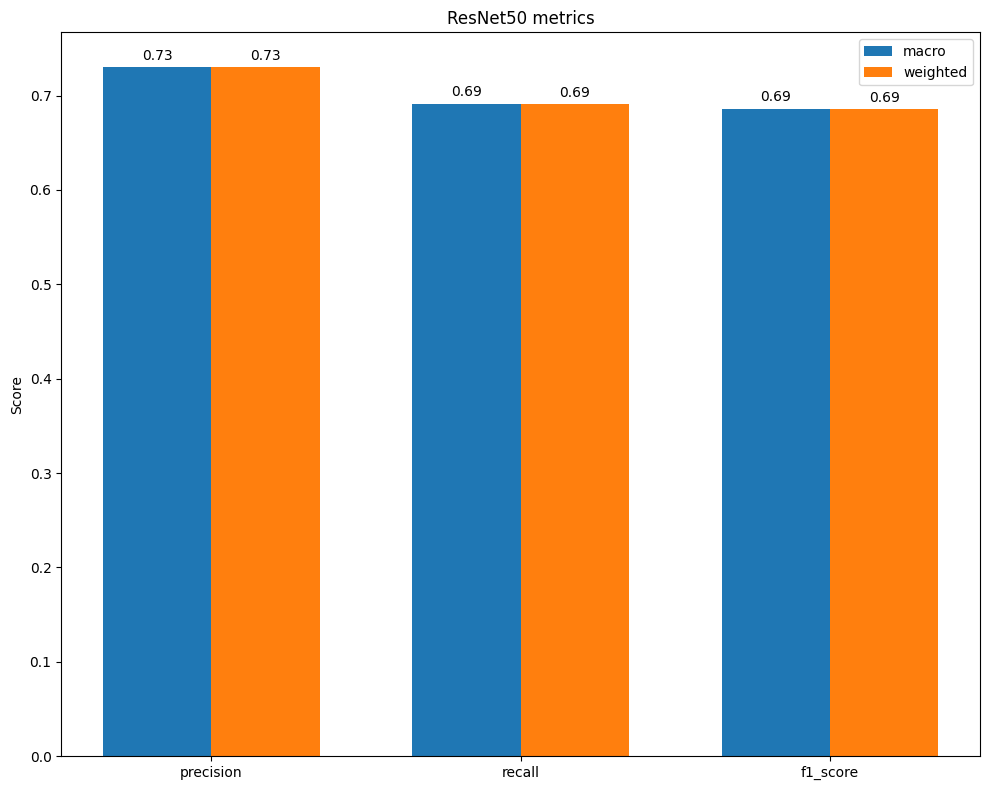

In [17]:
train_losses, train_accuracies, validation_losses, validation_accuracies, test_accuracies, test_precisions_macro, test_recalls_macro, test_f1_scores_macro, test_precisions_weighted, test_recalls_weighted, test_f1_scores_weighted = train_and_evaluate(model=resnet50, trainloader=train_dl, validationloader=validation_dl, test_loader=test_dl, isVGG16=False)

In [18]:
# Загрузка всей модели
path_to_load_full = '/content/drive/My Drive/ColabNotebooks/resnet50Model.pth'

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
m = ResNet_50()
m = nn.DataParallel(m)
m = torch.load(path_to_load_full)
m.to(device)
m.eval()


DataParallel(
  (module): ResNet_50(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
   

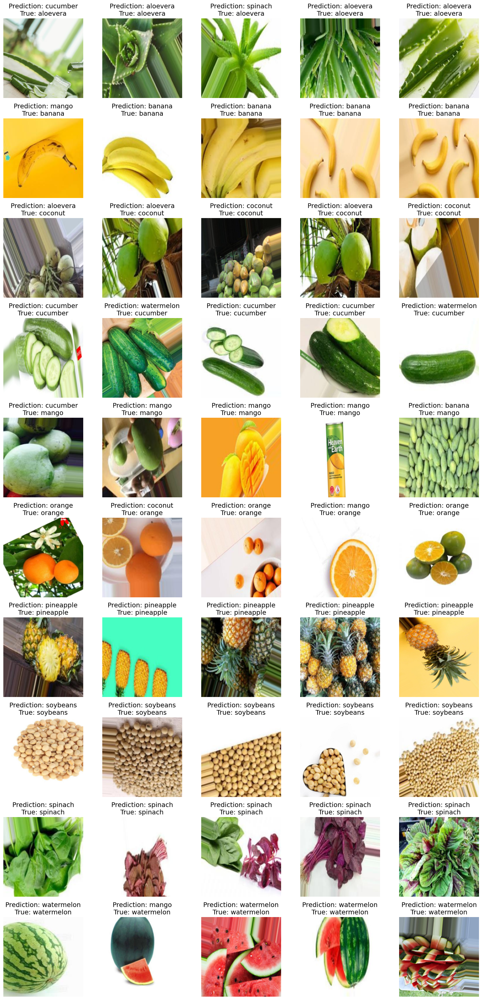

In [19]:
visualize_model(m, test_dl.dataset.class_names)

In [21]:
import seaborn as sns

def plot_confusion_matrix(cm, class_names):
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.show()

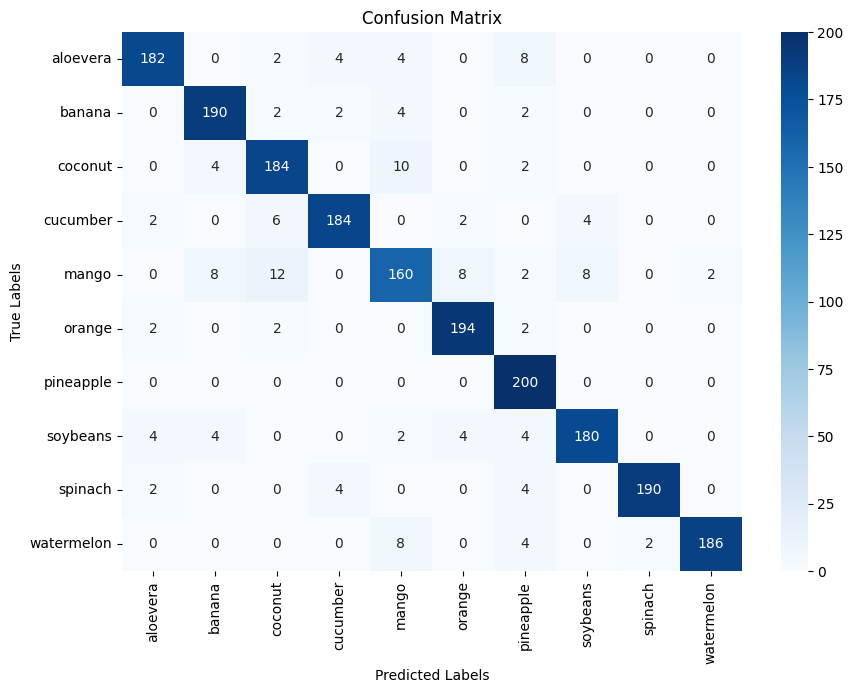

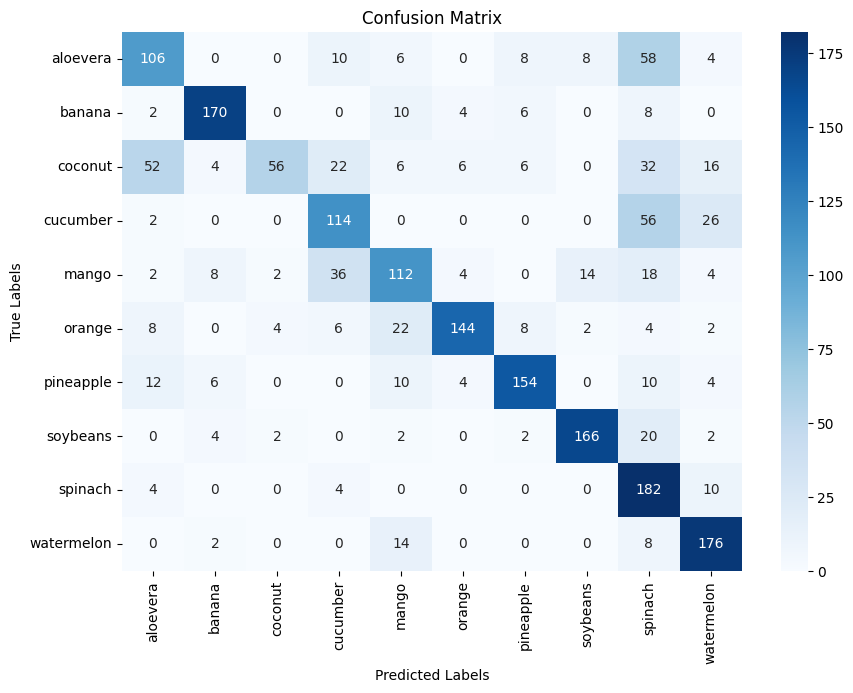

In [22]:
from sklearn.metrics import confusion_matrix

def cm_model(model, test_loader, device):
    all_preds = []
    all_labels = []
    model.eval()
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.view(-1).cpu().numpy())
            all_labels.extend(labels.view(-1).cpu().numpy())

    # Compute the confusion matrix
    cm = confusion_matrix(all_labels, all_preds)
    return cm

# Подготовка данных
device = get_device()  # Убедитесь, что устройство (CPU или GPU) верно определено
vgg16.to(device)
resnet50.to(device)

# Тестирование моделей и визуализация Confusion Matrix
cm_vgg16 = cm_model(vgg16, test_dl, device)
cm_resnet50 = cm_model(resnet50, test_dl, device)

# Визуализация Confusion Matrix для каждой модели
plot_confusion_matrix(cm_vgg16, test_dl.dataset.class_names)
plot_confusion_matrix(cm_resnet50, test_dl.dataset.class_names)
